In [1]:
import earthdaily.earthone as eo
from earthdaily.earthone.catalog import (
    Blob,
    EventSubscription,
    EventSubscriptionComputeTarget,
    EventType,Image, 
    Placeholder, 
    Product, 
    properties as p
)
from earthdaily.earthone.compute import Function

In [27]:
import json, os, sys, time, yaml
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime

In [3]:
from water_quality_utils import create_s2_surrogate, apply_cloud_mask

In [4]:
with open("config.yaml", "r") as file:
    config = yaml.load(file, yaml.FullLoader)

In [5]:
major, minor = sys.version_info.major, sys.version_info.minor
compute_image = f"python{major}.{minor}:latest"

In [6]:
auth = eo.auth.Auth.get_default_auth()
org = auth.payload["org"]
user_hash = auth.namespace

In [7]:
run_id = user_hash + ":" + datetime.utcnow().strftime("%Y%m%d")
func_name = f"Water Quality Monitor {run_id}"
func_name

'Water Quality Monitor 3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618'

In [8]:
surrogate_s2_product = create_s2_surrogate(
    f"surrogate-s2:{run_id}",
    config['surrogate_product_name'],
    config['in_geojson_path'],
    config['s2_sample_dates']
)
surrogate_s2_product

Created surrogate product earthdaily:surrogate-s2:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618
2024-01-14
Downloaded 2024-01-14
2024-03-14
Downloaded 2024-03-14
2024-04-03
Downloaded 2024-04-03
2024-04-18
Downloaded 2024-04-18
2024-05-18
Downloaded 2024-05-18
2024-05-21
Downloaded 2024-05-21
2024-06-07
Downloaded 2024-06-07
2024-08-01
Downloaded 2024-08-01
2024-08-21
Downloaded 2024-08-21
Uploaded initial sample image


Product: Water Quality Surrogate Sentinel-2 Product
  id: earthdaily:surrogate-s2:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618
  created: Thu Jun 18 14:10:21 2026

In [9]:
baseline_prod = (
    Product.search()
    .filter(p.owners==f"user:{user_hash}")
    .find_text(config['baseline_product_name'])
    .filter(p.tags=='water-quality-examples')
    .sort("created", ascending=False)
    .limit(1)
    ).collect()[0]
baseline_prod

Product: Demo Turbidity Baseline
  id: earthdaily:turbidity-baseline:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618
  created: Thu Jun 18 14:02:08 2026

In [10]:
gdf = gpd.read_file(config['in_geojson_path'])

In [11]:
target_image = Image.get(f"{surrogate_s2_product.id}:{config['s2_sample_dates'][0]}")
target_image

Image: 2024-01-14
  id: earthdaily:surrogate-s2:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618:2024-01-14
  product: earthdaily:surrogate-s2:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618
  created: Thu Jun 18 14:11:05 2026

In [12]:
baseline_ic = baseline_prod.images().collect()
baseline_ndti = baseline_ic.mosaic("ndti", geocontext=target_image.geocontext)

In [13]:
target_ndarr = target_image.ndarray(config['bands'], geocontext=target_image.geocontext)
target_scl = target_image.ndarray(["scl"], geocontext=target_image.geocontext)

/opt/anaconda3/envs/earthone/lib/python3.11/site-packages/matplotlib/cm.py:494: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


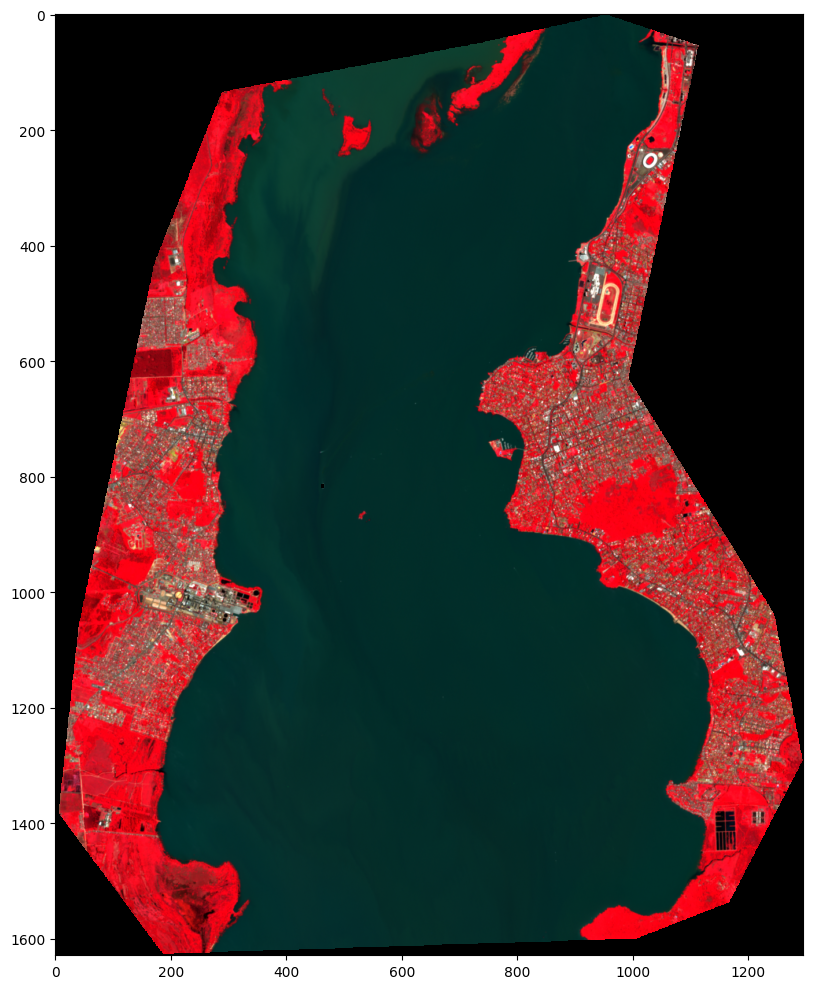

In [14]:
target_ndarr = apply_cloud_mask(target_ndarr, target_scl)
eo.utils.display(target_ndarr)

In [15]:
target_nir = target_ndarr[0]
target_red = target_ndarr[1]
target_green = target_ndarr[2] 

target_ndwi = (target_green-target_nir)/(target_green+target_nir)
target_ndti = (target_red - target_green) / (target_red + target_green)

target_ndti_water = np.where(target_ndwi>0, target_ndti, np.nan)

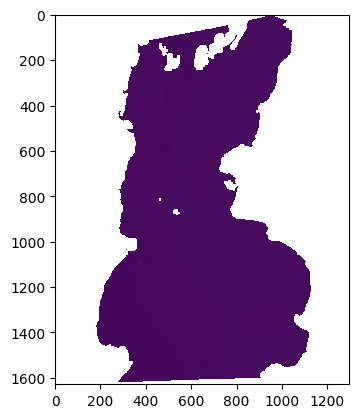

In [16]:
diff = target_ndti_water - baseline_ndti
plt.imshow(diff[0])

In [17]:
pct_anomalous = 100 * np.nansum(diff > config['ANOMALY_THRESHOLD']) / np.sum(~np.isnan(diff))
pct_severe = 100 * np.nansum(diff > config['SEVERE_THRESHOLD']) / np.sum(~np.isnan(diff))

if pct_anomalous > 5.0:
    summary_text = (
        f"Turbidity increased significantly across {pct_anomalous:.0f}% of the water "
        f"surface relative to baseline"
    )
if pct_severe > 5.0:
    summary_text += f", with {pct_severe:.0f}% showing severe elevation"
    summary_text += f". Mean NDTI increase: {np.nanmean(diff):.2f}."
else:
    summary_text = "No significant turbidity anomaly detected relative to baseline."
print(summary_text)

No significant turbidity anomaly detected relative to baseline.


In [18]:
config['ANOMALY_THRESHOLD'], config['SEVERE_THRESHOLD']

(0.15, 0.3)

In [19]:
def water_quality_monitor(
    image_id: str, 
    ANOMALY_THRESHOLD: float = 0.15, 
    SEVERE_THRESHOLD: float = 0.30
):
    import earthdaily.earthone as eo
    from earthdaily.earthone.catalog import Product, Image, properties as p
    import yaml
    import numpy as np
    from water_quality_utils import apply_cloud_mask
    
    with open("config.yaml", "r") as file:
        config = yaml.load(file, yaml.FullLoader)
        
    auth = eo.auth.Auth().get_default_auth()
    
    target_img = Image.get(image_id)
    
    baseline_prod = (
        Product
        .search()
         .filter(p.owners==f"user:{auth.namespace}")
        .find_text("Turbidity Baseline")
        .filter(p.tags=='water-quality-examples')
         .sort("created", ascending=False)
         .limit(1)
        ).collect()[0]

    baseline_ic = baseline_prod.images().collect()
    ctx = baseline_ic[0].geocontext
    
    baseline_ndti = baseline_ic.mosaic("ndti", geocontext=target_img.geocontext)
    print("Rastered baseline imagery...")
    
    target_img = Image.get(image_id)
    target_ndarr = target_img.ndarray(["nir", "red", "green"], geocontext=target_img.geocontext)
    target_scl = target_img.ndarray(["scl"], geocontext=target_img.geocontext)
    
    print("Rastered target imagery...")
    target_ndarr = apply_cloud_mask(target_ndarr, target_scl)
    print("Cloud masked")
    
    target_nir = target_ndarr[0]
    target_red = target_ndarr[1]
    target_green = target_ndarr[2] 
    
    target_ndwi = (target_green-target_nir)/(target_green+target_nir)
    target_ndti = (target_red - target_green) / (target_red + target_green)
    print("Computed NDTI and masked to NDWI")
    target_ndti_water = np.where(target_ndwi>0, target_ndti, np.nan)
    
    diff = target_ndti_water - baseline_ndti
    
    pct_anomalous = 100 * np.nansum(diff > ANOMALY_THRESHOLD) / np.sum(~np.isnan(diff))
    pct_severe = 100 * np.nansum(diff > SEVERE_THRESHOLD) / np.sum(~np.isnan(diff))
    
    if pct_anomalous > 5.0:
        summary_text = (
            f"Turbidity increased significantly across {pct_anomalous:.0f}% of the water "
            f"surface relative to baseline"
        )
    if pct_severe > 5.0:
        summary_text += f", with {pct_severe:.0f}% showing severe elevation"
        summary_text += f". Mean NDTI increase: {np.nanmean(diff):.2f}."
    else:
        summary_text = "No significant turbidity anomaly detected relative to baseline."
    
    print(summary_text)
    return summary_text

In [20]:
water_quality_monitor(f"{surrogate_s2_product.id}:{config['s2_sample_dates'][0]}")

Rastered baseline imagery...
Rastered target imagery...
Cloud masked
Computed NDTI and masked to NDWI
No significant turbidity anomaly detected relative to baseline.


'No significant turbidity anomaly detected relative to baseline.'

In [22]:
async_func = Function(
    water_quality_monitor,
    name=func_name,
    image=compute_image,
    cpus=2,
    memory=4,
    maximum_concurrency=20,
    timeout=300,
    retry_count=0,
    include_modules=['water_quality_utils'],
    requirements=['pyyaml'],
    include_data=["config.yaml"]
)
async_func.save()
print(f"Created: {async_func.id}")

Created: f908a9fd-77c4-4cef-94d1-69557a4ab422


In [23]:
for subscription in (
    EventSubscription
    .search()
    .filter(p.owners==f"user:{user_hash}")
    .filter(p.name=="water_quality_subscription")
).collect():
    print(f"Deleting {subscription}")
    subscription.delete()

Deleting EventSubscription: water_quality_subscription
  id: earthdaily:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:water_quality_subscription
  created: Wed Jun 17 20:03:58 2026


In [24]:
subscription = EventSubscription(
    name="water_quality_subscription",
    event_type=[EventType.NEW_IMAGE],
    event_namespace=[surrogate_s2_product.id],
    geometry = gdf.iloc[0]['geometry'].buffer(0.5),
    targets=[
        EventSubscriptionComputeTarget(
            async_func.id, 
            Placeholder("event.detail.id")
        )
    ]
)
subscription.save()
print(f"Created Subscription: {subscription.id}")

Created Subscription: earthdaily:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:water_quality_subscription


In [25]:
job1 = async_func(f"{surrogate_s2_product.id}:{config['s2_sample_dates'][0]}")
job1

Job(id='1a089059-6a86-46d6-98ba-7795bfec86d5', function_id='f908a9fd-77c4-4cef-94d1-69557a4ab422', creation_date=datetime.datetime(2026, 6, 18, 10, 11, 41, 746924, tzinfo=datetime.timezone(datetime.timedelta(days=-1, seconds=72000), 'EDT')), args=['earthdaily:surrogate-s2:3935a4c94291fae6f3fedfbaa29a292a8c5687b2:20260618:2024-01-14'], error_reason=None, execution_count=0, exit_code=None, kwargs={}, environment=None, last_completion_date=None, last_execution_date=None, runtime=None, status=<JobStatus.PENDING: 'pending'>, statistics=None, tags=[], provisioning_time=None, pull_time=None)

In [29]:
for sample_date in config['s2_sample_dates'][1:]:
    print(sample_date)
    image = Image(
        name=sample_date,
        product=surrogate_s2_product,
        acquired=sample_date
    )
    upload = image.upload(
        [f"data/{sample_date}.tif",
         f"data/{sample_date}-scl.tif"],
        overwrite=True,
    )
    upload.wait_for_completion()
    os.remove(f"data/{sample_date}.tif")
    os.remove(f"data/{sample_date}-scl.tif")
    print(upload.status)
    time.sleep(5)

2024-04-03
success
2024-04-18
success
2024-05-18
success
2024-05-21
success
2024-06-07
success
2024-08-01
success
2024-08-21
success


In [30]:
async_func.wait_for_completion()

In [31]:
results = list(async_func.jobs.collect().each.result())
res_ids = list(async_func.jobs.collect().each.args[0])

In [32]:
surrogate_images = surrogate_s2_product.images().collect()
surrogate_stack = surrogate_images.stack(config['bands'], geocontext=surrogate_images[0].geocontext)

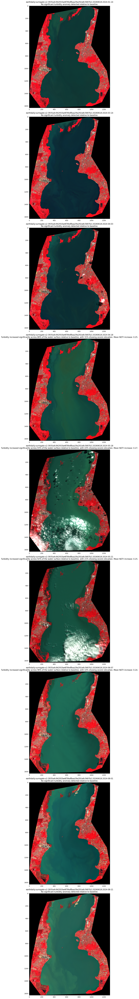

<Figure size 640x480 with 0 Axes>

In [33]:
id_to_index = {img_id: i for i, img_id in enumerate(res_ids)}
reorder_indices = [id_to_index[img_id] for img_id in list(surrogate_images.each.id)]

results_reordered = [results[i] for i in reorder_indices]
res_ids_reordered = [res_ids[i] for i in reorder_indices]

titles = [res_ids_reordered[i] + "\n" + results_reordered[i] for i in range(len(res_ids_reordered))]

eo.utils.display(*surrogate_stack, title=titles)
plt.savefig("output.png")